## Notebook Purpose
This notebook is used to plot high-resolution zoomed-in SMB maps over sections of Imja Lhotse Shar Glacier (Figure 6 A/B).

#### Last updated: May 23, 2023

## TODO:
- Update imports when new library has been built up with all updates
-Generalise path to data products during revisions, after the data distribution plan is finalized

In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format='retina'


In [2]:
import numpy as np 
import geopandas as gpd
import matplotlib.pyplot as plt
from imview import pltlib
import pandas as pd
from pygeotools.lib import warplib,geolib,iolib,malib,filtlib,timelib
import os,sys,glob,shutil
from debris_cover_smb import glac_dyn, constants, geospatial
import warnings
warnings.filterwarnings('ignore')

In [3]:
%matplotlib inline

In [5]:
%cd /nobackup/sbhusha1/chapter2/HighresDebrisCover_SMB_Data/ImjaLhotseShar/

/nobackupp11/sbhusha1/chapter2/HighresDebrisCover_SMB_Data/ImjaLhotseShar


In [6]:

euldz_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif'
lagdz_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_lagrangian_dhdt.tif'
downslope_dz_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_downslope_dhdt.tif'
smb_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_smb_dhdt.tif'
dem1_fn = 'dem/20151002_0651_10200100457F0C00_1020010042C0CE00-DEM_2m.tif'
ortho_img1 = 'orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif'
ortho_img2 = 'orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif'

In [20]:
low_res_extent = [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
ds_extent = low_res_extent
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]

In [21]:
#ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif',
#                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif'])
ds_list_ortho_cliff2 = warplib.memwarp_multi_fn([ortho_img1,
                                                 ortho_img2],extent=low_res_extent)
cliff2_t1,cliff2_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff2]
#low_res_extent = geolib.ds_extent(ds_list_ortho_cliff2[0])
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn],extent=low_res_extent)
euldz,lagdz,downslope_dz,smb,dem1 = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif
nl: 852 ns: 781 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 2: orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif
nl: 852 ns: 781 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...
Warping all inputs to the following:
Resolution: 2.0
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 5: SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 217 ns: 199 res: 2.000
100 - done.
0...10...20...30...

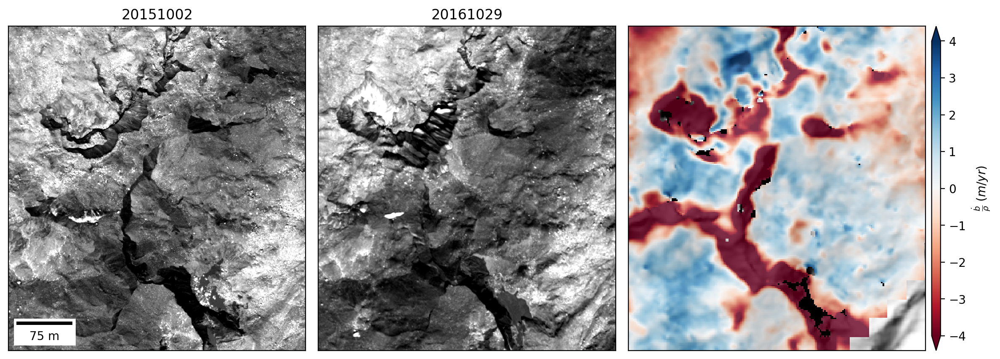

In [29]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff1_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002')
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff1_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029')
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

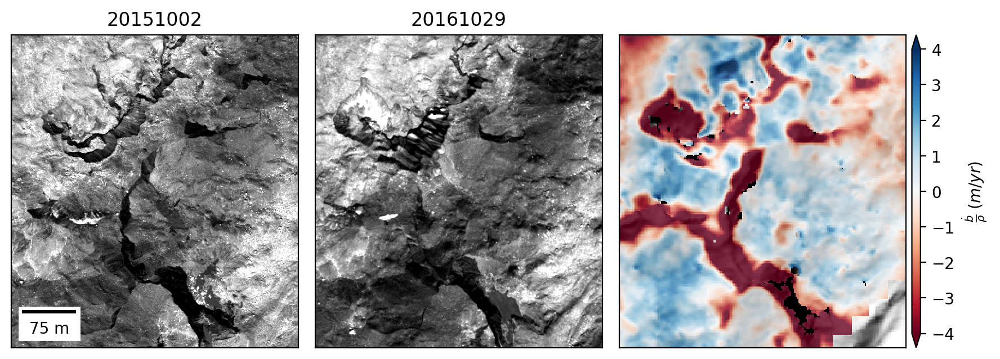

In [31]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff1_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002')
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff1_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029')
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_small.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

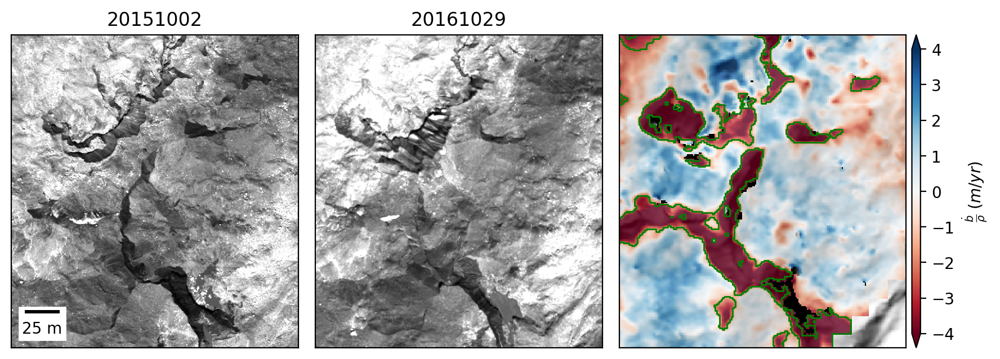

In [22]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)),extent=fig_extent)
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)),extent=fig_extent)
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area_small_with_cliffs.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

## Upper Area

In [11]:
low_res_extent = [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
ds_extent = low_res_extent
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]

In [8]:
#ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif',
#                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif'])
ds_list_ortho_cliff2 = warplib.memwarp_multi_fn([ortho_img1,
                                                 ortho_img2],extent=low_res_extent)
cliff2_t1,cliff2_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff2]
#low_res_extent = geolib.ds_extent(ds_list_ortho_cliff2[0])
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn],extent=low_res_extent)
euldz,lagdz,downslope_dz,smb,dem1 = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif
nl: 2264 ns: 1860 res: 0.510
0...10...20...30...40...50...60...70...80...90...2 of 2: orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif
nl: 2264 ns: 1860 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...
Warping all inputs to the following:
Resolution: 2.0
Extent: [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 5: SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 577 ns: 474 res: 2.000
100 - done.
0...10...20...30...40...50...60

In [44]:
malib.calcperc(cliff2_t1)

(0.08147532492876053, 0.6096022725105286)

In [45]:
malib.calcperc(cliff2_t2)

(0.19307621873915196, 1.4028712267875707)

In [9]:
ice_cliff_gpkg = gpd.read_file('SMB_data/imja_icecliff_final_location.gpkg')

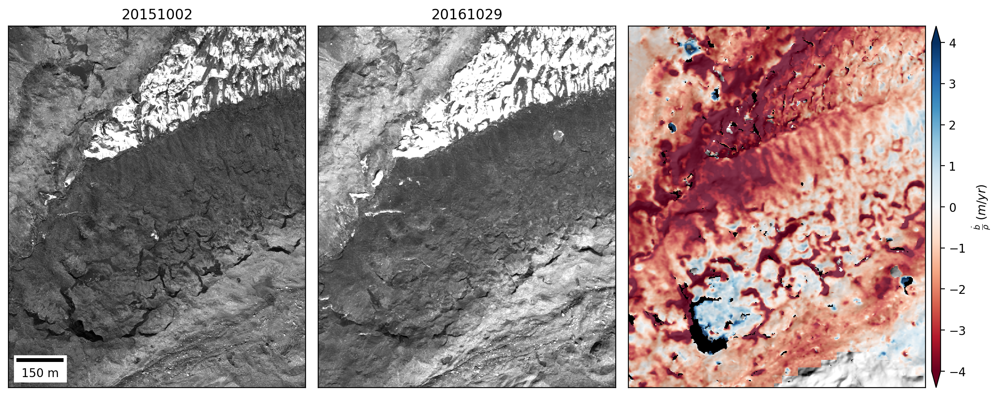

In [46]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
#f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

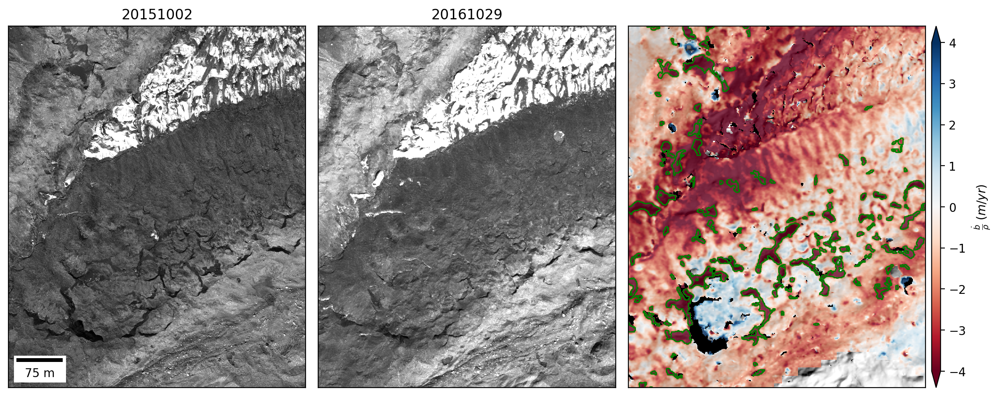

In [17]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)),extent=fig_extent)
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)),extent=fig_extent)
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
#ice_cliff_gpkg.plot(ax=ax[0],facecolor='None',edgecolor='green',linewidth=2)
plt.tight_layout()
#f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

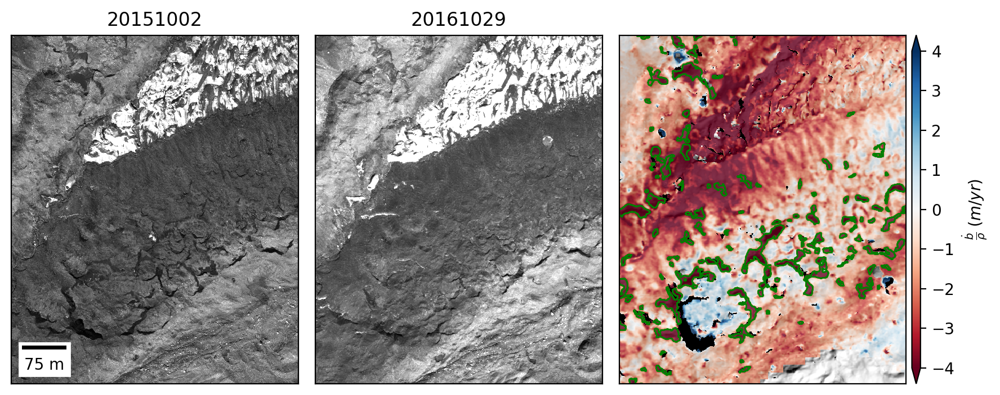

In [19]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)),extent=fig_extent)
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)),extent=fig_extent)
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area_small_with_cliffs.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

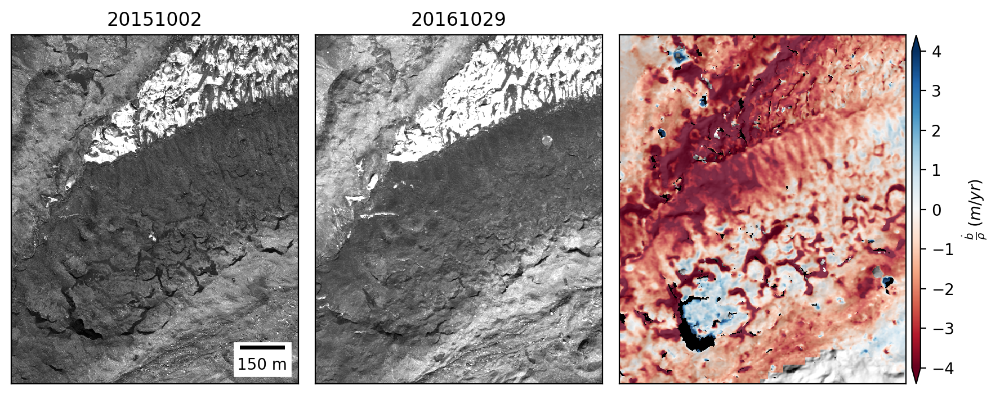

In [47]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower right')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area_small.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

In [48]:
pwd

'/nobackupp11/sbhusha1/chapter2/imja/20230223'